#  Design contours using SOM 

In [2]:
%load_ext autoreload

import os 
import sys
import time
import logging
import re
from tqdm import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from natsort import natsorted


sys.path.append(os.path.dirname(os.getcwd()))
from GRIDGEN.src import get_arrays as ga
from GRIDGEN.src import contours 
from GRIDGEN.src import masks
from GRIDGEN.src.mask_properties import GetMasksProperties

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


define the logger :  can be None, and is set to INFO

In [3]:
# define the logger :  can be None, and is set to INFO
# Custom logger setup
logger = logging.getLogger('contour_logger')
handler = logging.StreamHandler()
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
handler.setFormatter(formatter)
logger.addHandler(handler)
logger.setLevel(logging.INFO)

Get the files

In [4]:
xenium_path =  '../../xenium_data/HLA/GD_TMA1_S3/fov_filtered'

to_exclude = ['TMA1_Selection15_filtered.csv', 'TMA1_Selection24_filtered.csv', # tonsil
            'TMA1_Selection18_filtered.csv', 'TMA2_Selection11_filtered.csv' # normal
             ]
files_tma1 = os.listdir(xenium_path)
# Adding the full path to each file
files = [os.path.join(xenium_path, file) for file in files_tma1 if file not in to_exclude]
print(len(files_tma1))

27


put here how a file is

# 1. Define Tumour Border  based on density of genes

This intends to based on defined genes to find tumour areas and empty areas.
The stroma/other is defined as the area that is not empty and not tumour. 

We need to define: 

1. Parameters for tumour contours
    * Genes to consider :
  Use the marker genes of the gene list with log fold changes for epithelial cells
  
    * density
    * minimum area
    * kernel size
    
    this will define for an overlapping area with "kernel size" * "kernel_size" a minimum number of "density" genes of interest. The contiguous area of the contour will have at least "minimum area" 
 
2. Parameters for emptyness contours
    * density
    * minimum area
    * kernel size
   this will define for an overlapping area with "kernel size" * "kernel_size" a maximum number of "density"/ counts of all genes. The contiguous area of the contour will have at least "minimum area" 

../../xenium_data/HLA/GD_TMA1_S3/fov_filtered/TMA1_Selection25_filtered.csv
n genes: 480
shape: 1935, 1785
n hits 4210232
==== tumour ====
total contours found  141
total contours after filtering by area 37
====
total contours found  163
total contours after filtering by area 9


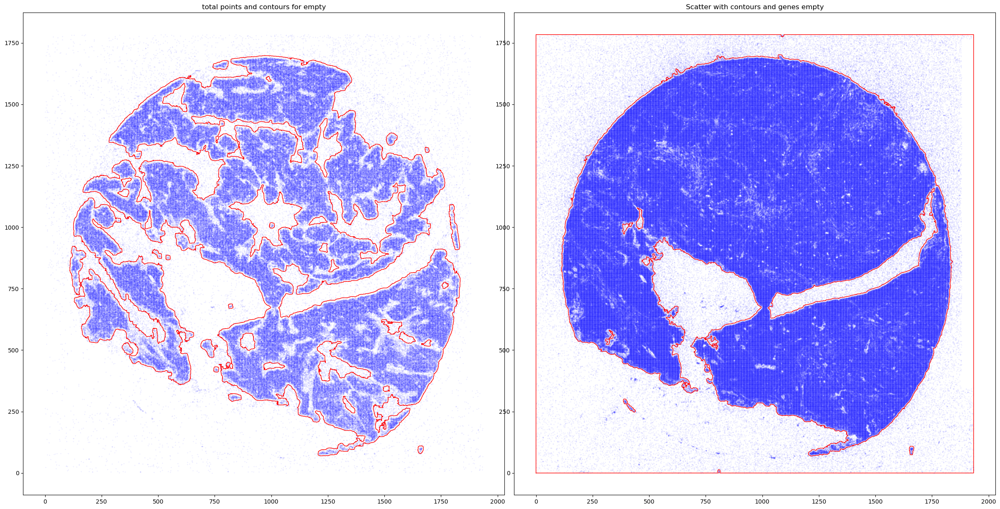

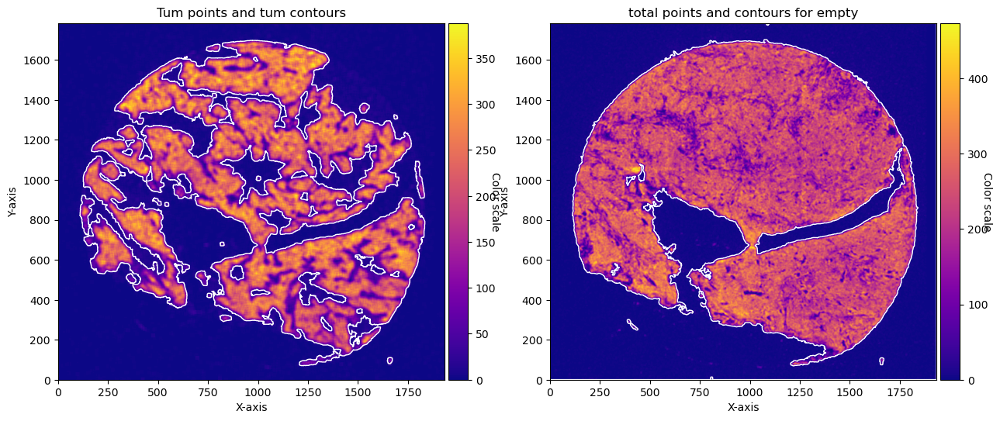

In [5]:
# defined with the gene list f
target_tum = ['EPCAM', 'SMIM22','CLDN3', 'KRT18','LGALS4', 'KRT8', 'ELF3','TSPAN8', 'STMN1', 'CD47', 'MYC', 'LGALS3'] 

# param tum
density_th_tum = 25    # 50
min_area_th_tum =  500 #1000     check how much is a cell 
kernel_size_tum = 20   # 20

# param empty
density_th_empty = 20
min_area_th_empty = 50 #400
kernel_size_empty = 10



density_th_tum = 25    # 50
min_area_th_tum = 200
kernel_size_tum = 20   # 20

# param empty
density_th_empty = 20
min_area_th_empty = 400
kernel_size_empty = 10


# we will do for a single file 
file_csv = files[7]
print(file_csv)
df_total = pd.read_csv(file_csv)
df_total = df_total[['x_location', 'y_location', 'feature_name']]
df_total = df_total.rename(columns={'feature_name': 'target'})
df_total = df_total[~df_total['target'].str.contains('System|egative')]
df_total['X'] = df_total['x_location'] - min(df_total['x_location'])
df_total['Y'] = df_total['y_location'] - min(df_total['y_location'])

n_genes = len(df_total['target'].unique())
height = int(max(df_total['X'])) + 1
width = int(max(df_total['Y'])) + 1

print(f'n genes: {n_genes}')
print(f'shape: {height}, {width}')
print(f'n hits {len(df_total)}')

# this makes the sparse df to an array with the spatial information 
target_dict_total = {target: index for index, target in enumerate(df_total['target'].unique())}
array_total = ga.transform_df_to_array(df = df_total, target_dict=target_dict_total, array_shape = (height, width,len(target_dict_total))).astype(np.int8)

# creating subsets 
df_subset_tum, array_subset_tum, target_indices_subset_tum = ga.get_subset_arrays(df_total, array_total,target_dict_total,
                                                                     target_list=target_tum, target_col = 'target')

# obtain contours 
CTum = contours.GetContour(array_subset_tum, contour_name='tum')
CTum.get_conv_sum(kernel_size=kernel_size_tum, kernel_shape='square')
CTum.contours_from_sum(density_threshold = density_th_tum,
                       min_area_threshold = min_area_th_tum , directionality = 'higher')

CEmpty = contours.GetContour(array_total, contour_name='empty')
CEmpty.get_conv_sum(kernel_size=kernel_size_empty, kernel_shape='square')
CEmpty.contours_from_sum(density_threshold = density_th_empty,
                       min_area_threshold = min_area_th_empty, directionality = 'lower') # attention that directionality is lower here 

print('==== tumour ====')
print('total contours found ', CTum.total_valid_contours)
print('total contours after filtering by area', CTum.contours_filtered_area)

print('====')
print('total contours found ', CEmpty.total_valid_contours)
print('total contours after filtering by area', CEmpty.contours_filtered_area)

# PLOTs -- instead of plotting just with the function for example: CTum.plot_contours_scatter, we will make a composite image 

fig, axs = plt.subplots(1, 2, figsize=(30, 15))
CTum.plot_contours_scatter(path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
                           c_points= 'blue',c_contours= 'red', ax=axs[0])
axs[0].set_title('Tum points and tum contours')  


CEmpty.plot_contours_scatter(path=None, show=False, s=0.05, alpha=0.5, linewidth=1,
                           c_points= 'blue',c_contours= 'red', ax=axs[1])
axs[0].set_title('total points and contours for empty')  
plt.subplots_adjust(wspace=0.02)  # Adjust to your preference

plt.show()
   

fig, axs = plt.subplots(1, 2, figsize=(15, 10))

CTum.plot_conv_sum(cmap='plasma', c_countour='white', ax=axs[0])
axs[0].set_title('Tum points and tum contours')

CEmpty.plot_conv_sum(cmap='plasma', c_countour='white', ax=axs[1])
axs[1].set_title('total points and contours for empty')

plt.show()

# Use SOM. Bin the image and aply a SOM cluster
Each image is analysed separately

In [7]:
# Extract the filename without extension
filename = os.path.basename(file_csv).split('.')[0]

# Extract the desired part
name_file = '_'.join(filename.split('_')[:2])

We will get the bins defined in bin size from a list of df. In this case just one df of an image

These bins are not overlapping

The counts of eachbin with all the space information are saved in an adata object. 

Preprocess bin applies single cell normalization oipeline to the bin information ( normalize total and log1) and filters out empty bins <10 counts.

In [43]:
%autoreload
from src.binsom import GetBins, GetContour #.mask_properties import GetMasksProperties

bin_size = 5  # 10
min_counts = 10 # 10
unique_targets = df_total['target'].unique()

GB = GetBins(bin_size, unique_targets, logger)
GB.get_bin_cohort(df_list= [df_total], df_name_list = [name_file], cohort_name = 'HLA')
GB.preprocess_bin(min_counts = min_counts)
adata = GB.adata

2024-11-11 23:23:32,472 - contour_logger - INFO - Time to get bins for 1 dataframes: 1.99 seconds
INFO:contour_logger:Time to get bins for 1 dataframes: 1.99 seconds
2024-11-11 23:23:32,472 - contour_logger - INFO - Number of bins: 104903
INFO:contour_logger:Number of bins: 104903
2024-11-11 23:23:32,473 - contour_logger - INFO - Number of genes: 480
INFO:contour_logger:Number of genes: 480


Now that we have the bins of the images. We can apply a SOM cluster. we will apply a SOM map with 2 cells, and see if it accurately divides tumour from stroma due to their big differences. 

In [44]:
GC = GetContour(adata, logger)
GC.run_som(som_shape = (2,1), n_iter = 5000, sigma=.5, learning_rate=.5, random_state = 42)

2024-11-11 23:23:42,782 - contour_logger - INFO - Time to run som on 71596 bins: 0.96
INFO:contour_logger:Time to run som on 71596 bins: 0.96
2024-11-11 23:23:42,783 - contour_logger - INFO - Number of clusters: 2
INFO:contour_logger:Number of clusters: 2
2024-11-11 23:23:42,785 - contour_logger - INFO - number of bins in each cluster: cluster_som
1    38864
0    32732
Name: count, dtype: int64
INFO:contour_logger:number of bins in each cluster: cluster_som
1    38864
0    32732
Name: count, dtype: int64


As one can see this is almost instaneously. We can eval the differentially gene expression. one can use the GC.adata object and run preferred analysis. You can also use GC.eval_som_statistical

In [51]:
GC.eval_som_statistical(top_n=10)

2024-11-11 23:30:30,589 - contour_logger - INFO - n top genes for group 0
INFO:contour_logger:n top genes for group 0
2024-11-11 23:30:30,591 - contour_logger - INFO - 
    names      scores  logfoldchanges  pvals  pvals_adj
0   SPARC  267.165192        3.752638    0.0        0.0
1  COL1A1  233.530807        3.768715    0.0        0.0
2  IGFBP7  192.367538        3.981079    0.0        0.0
3     VIM  149.497757        2.764807    0.0        0.0
4  COL3A1  147.316376        4.083336    0.0        0.0
5  COL4A1  141.876938        3.532753    0.0        0.0
6  COL4A2  134.274185        3.818816    0.0        0.0
7   IGHG1  120.770187        2.004951    0.0        0.0
8     LUM  117.566292        3.825952    0.0        0.0
9   TIMP2  115.772179        3.567706    0.0        0.0
INFO:contour_logger:
    names      scores  logfoldchanges  pvals  pvals_adj
0   SPARC  267.165192        3.752638    0.0        0.0
1  COL1A1  233.530807        3.768715    0.0        0.0
2  IGFBP7  192.367538     

From the genes it appears that is separating bins based n stroma/ tumour . 

Let's see graphicaly

    we can see in two different ways. one is to transform the bins into an image again using GC.get_som_2d_image(bin_size = 10) and plot it with GC.plot_som. 

    The other option is to use squidpy and the centroids information stored in the adata object. In this one only the centroids are plotted ( but all the bins have the same size) 

TMA1_Selection25


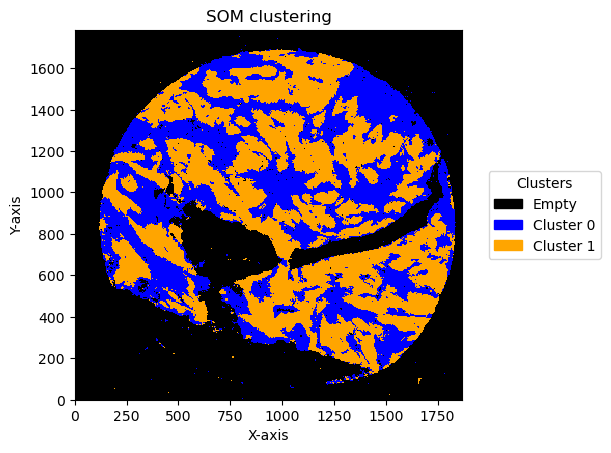

In [48]:
%autoreload
from src.binsom import GetBins, GetContour #.mask_properties import GetMasksProperties
import matplotlib.colors as mcolors

som_images = GC.get_som_2d_image(bin_size = 5)

# Create a custom colormap and legends 
cmap = mcolors.ListedColormap(['black', 'blue', 'orange'])
legend_labels = {0: 'Empty', 1: 'Cluster 0', 2: 'Cluster 1'}

for name, som_image in som_images.items():
    print(name)
    GC.plot_som(som_image, cmap = cmap, path=None, show=True, figsize=(5, 5), ax=None, legend_labels=legend_labels)

TMA1_Selection25


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


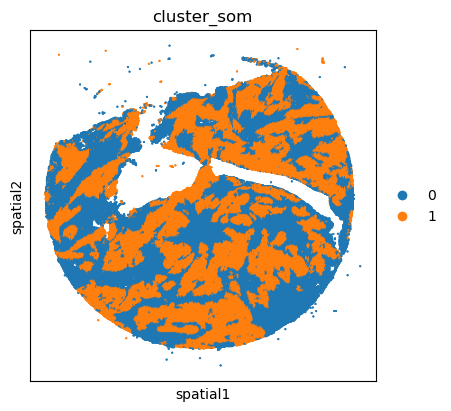

In [25]:
import squidpy as sq
# adata.obsm["spatial"] = adata.obs[["x_centroid", "y_centroid"]].copy().to_numpy()
unique_cases =adata.obs['name'].unique()
for case in unique_cases:
    # Filter the AnnData object for the current case
    adata_case = adata[adata.obs['name'] == case, :]
    print(case)
    plt.rcParams["figure.figsize"] = (5, 4)
    sq.pl.spatial_scatter(
            adata_case,
            library_id='name',
            shape=None,
            color=["cluster_som"],
            size=1,
    )
    plt.show()

We can use this information to build masks as we saw based on the contours defined by genes. 

SOM clusters are numbered. one needs to identify the identity of these clusters. from GC.eval_som_statistical(top_n=10), we can see that cluster 0 is Stroma (SPARC,  COL1A1, VIM ... ) and 1 is tumour (EPCAM, KRT18, KRT8 ...)

In [55]:
name, som_image = list(som_images.items())[0]
# pass the contour area threshold
GM = masks.GetMasks(image_shape = (som_image.shape[0], som_image.shape[1]))
mask_S = som_image==1
GM.mask_S = (GM.filter_mask_by_area(mask_S, min_area=700))
mask_T = som_image==2
GM.mask_T = (GM.filter_mask_by_area(mask_T, min_area=700))


#### tumour border analysis 
TA = masks.TumBorderAnalysis(GM)
# for expansions of 5,10, 15, 20 um --- approx. 43, 85, 128,170 px
TA.get_mask_tumour_border(expansions_pixels=[5,10,15,20], filter_area = 3000)
mask_stroma_tborder = TA.mask_S_tborder
mask_tumour_tborder = TA.mask_T_tborder # will be the same as T overall 
mask_TB_5px, mask_TB_10px,mask_TB_15px,mask_TB_20px = TA.mask_TB_tborders

INFO:GRIDGEN.src.masks:Filtering mask by area: 700
INFO:GRIDGEN.src.masks:Filtering mask by area: 700
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering Border mask by area: 3000
INFO:GRIDGEN.src.masks:Filtering mask by area: 3000


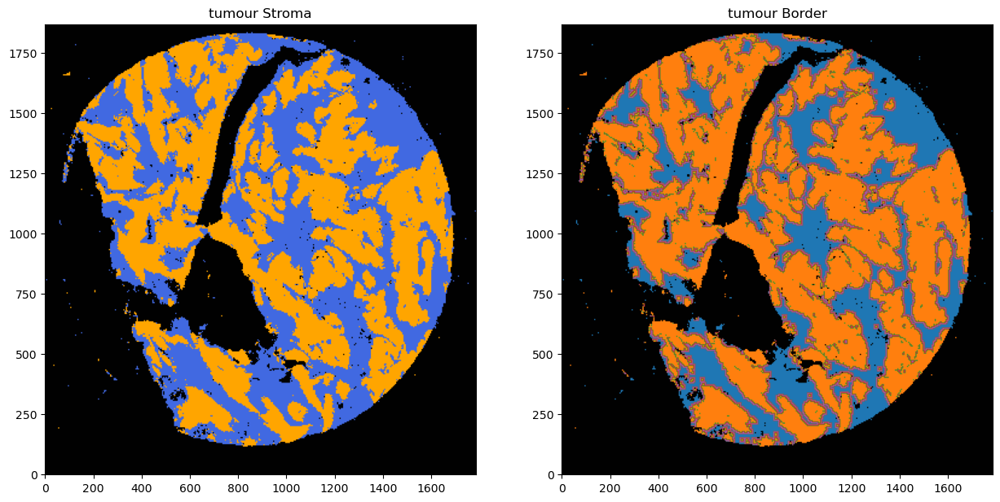

In [56]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
# Collect all legend handles and labels  # this is just for me to be able to print the labels 
handles, labels = [], []

GM.plot_masks(masks=[GM.mask_S, GM.mask_T], mask_names = ['Stroma', 'Tumour'],
          background_color=(1, 1, 1), mask_colors={'Stroma': (65, 105, 225), 'Tumour': (255, 165, 0)},   # {'Stroma': (0, 0, 255), 'Tumour': (255, 0, 0)
              path=None, show=False, ax=axs[0])
axs[0].set_title('tumour Stroma')  


handles.extend(axs[0].get_legend_handles_labels()[0])
labels.extend(axs[0].get_legend_handles_labels()[1])

GM.plot_masks(masks=[TA.mask_S_tborder,TA.mask_T_tborder,mask_TB_5px, mask_TB_10px,mask_TB_15px,mask_TB_20px],
              mask_names = ['Stroma remaining', 'Tumour', 'TB_5um', 'TB_10um','TB_15um','TB_20um'],
          background_color=(1, 1, 1), mask_colors=None, path=None, show=False, ax=axs[1])
axs[1].set_title('tumour Border')

handles.extend(axs[1].get_legend_handles_labels()[0])
labels.extend(axs[1].get_legend_handles_labels()[1])

# Remove legends from subplots
for ax in axs:
    ax.get_legend().remove()
# # Create a single legend for the whole figure
#     fig.legend(handles, labels, loc='lower center', ncol=len(handles))

plt.show()    

We can proceed and do everything as resuming mask information and hierarchy analysis as described in other notebooks. 

In [58]:
#todo. how this relates to the contours

In this pipeline there are things that can change the result. 
One is the bin size and the second one is the number of units in SOM . 

We can see the result effect of changing the bin size below: 

In [34]:
%autoreload
from src.binsom import GetBins, GetContour #.mask_properties import GetMasksProperties
cmap = mcolors.ListedColormap(['black', 'blue', 'orange'])
legend_labels = {0: 'Empty', 1: 'Cluster 0', 2: 'Cluster 1'}
plot_data = []

for bin_size in [5,10,15,20,30,50,70]:
    min_counts = bin_size *3 
    unique_targets = df_total['target'].unique()
    
    GB = GetBins(bin_size, unique_targets, logger)
    GB.get_bin_cohort(df_list= [df_total], df_name_list = [name_file], cohort_name = 'HLA')
    GB.preprocess_bin(min_counts = min_counts)
    adata = GB.adata
    GC = GetContour(adata, logger)
    GC.run_som(som_shape = (2,1), n_iter = 5000, sigma=.5, learning_rate=.5, random_state = 42)
    
    som_image = GC.get_som_2d_image(bin_size)
    plot_data.append((som_image, bin_size))

2024-11-11 23:08:49,638 - contour_logger - INFO - Time to get bins for 1 dataframes: 2.10 seconds
INFO:contour_logger:Time to get bins for 1 dataframes: 2.10 seconds
2024-11-11 23:08:49,639 - contour_logger - INFO - Number of bins: 104903
INFO:contour_logger:Number of bins: 104903
2024-11-11 23:08:49,640 - contour_logger - INFO - Number of genes: 480
INFO:contour_logger:Number of genes: 480
2024-11-11 23:08:51,025 - contour_logger - INFO - Time to run som on 70407 bins: 1.01
INFO:contour_logger:Time to run som on 70407 bins: 1.01
2024-11-11 23:08:51,027 - contour_logger - INFO - Number of clusters: 2
INFO:contour_logger:Number of clusters: 2
2024-11-11 23:08:51,028 - contour_logger - INFO - number of bins in each cluster: cluster_som
0    39029
1    31378
Name: count, dtype: int64
INFO:contour_logger:number of bins in each cluster: cluster_som
0    39029
1    31378
Name: count, dtype: int64
2024-11-11 23:08:55,357 - contour_logger - INFO - Time to get bins for 1 dataframes: 1.42 second

Plotting bin size: 5, SOM name: TMA1_Selection25


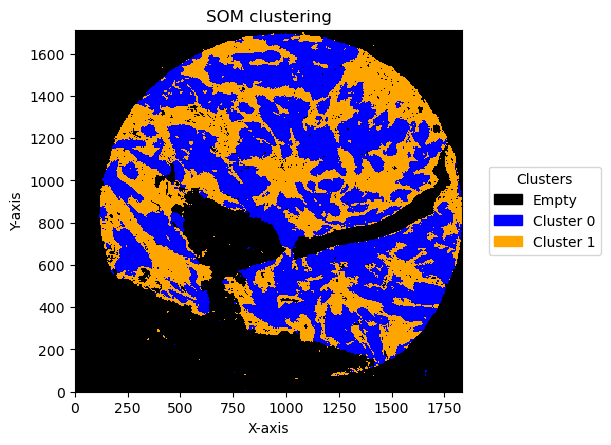

Plotting bin size: 10, SOM name: TMA1_Selection25


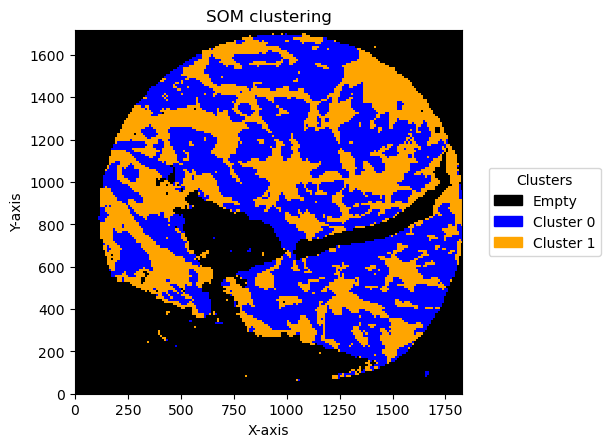

Plotting bin size: 15, SOM name: TMA1_Selection25


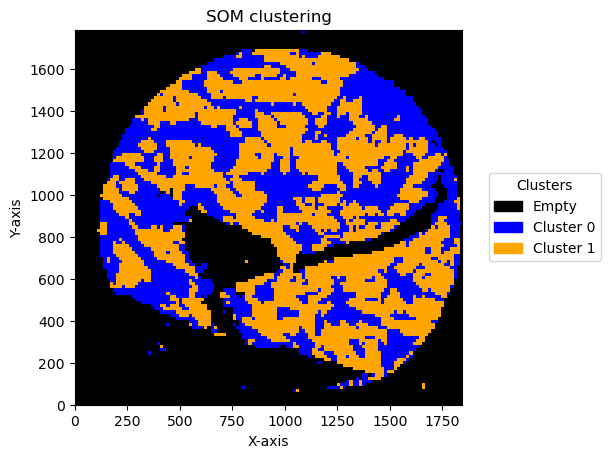

Plotting bin size: 20, SOM name: TMA1_Selection25


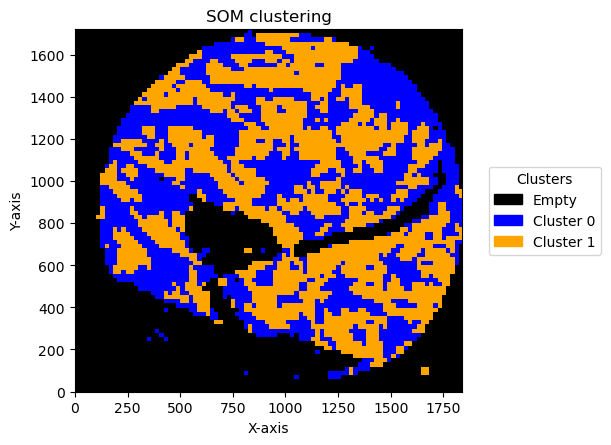

Plotting bin size: 30, SOM name: TMA1_Selection25


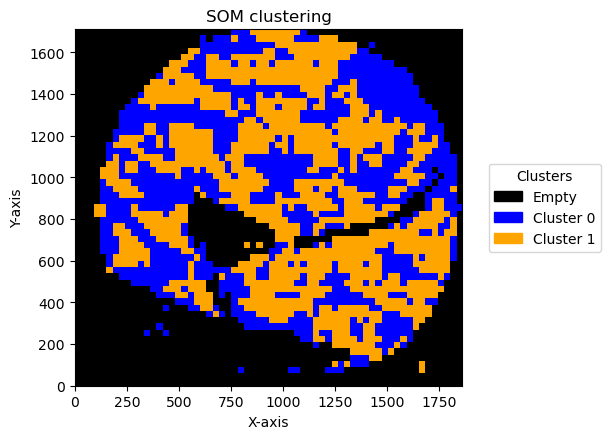

Plotting bin size: 50, SOM name: TMA1_Selection25


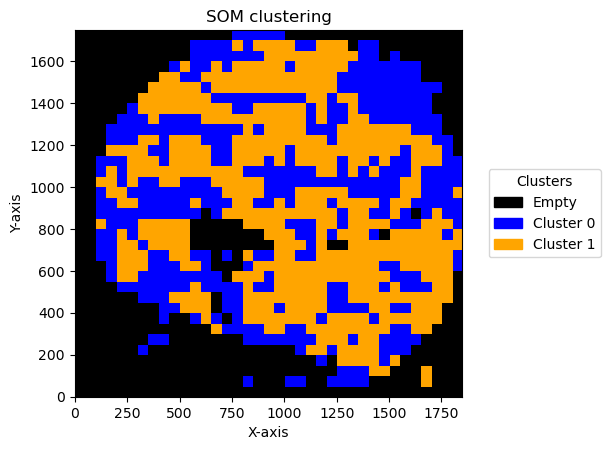

Plotting bin size: 70, SOM name: TMA1_Selection25


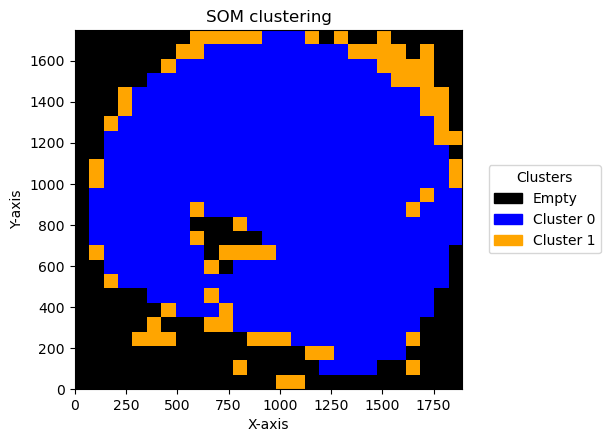

In [35]:
for som_image, bin_size in plot_data:
    for name, image in som_image.items():
        print(f"Plotting bin size: {bin_size}, SOM name: {name}")
        GC.plot_som(image, cmap=cmap, path=None, show=True, figsize=(5, 5), ax=None, legend_labels=legend_labels)

check how the number of units and distribution on the SOM map can reflect in the clusters obtained

In [37]:
%autoreload
from src.binsom import GetBins, GetContour #.mask_properties import GetMasksProperties
cmap = mcolors.ListedColormap(['black', 'blue', 'orange'])
legend_labels = {0: 'Empty', 1: 'Cluster 0', 2: 'Cluster 1'}
plot_data = []

for som_size in [(2,1), (3,1), (2,2),(3,3), (5,2)]:
    bin_size = 10
    min_counts = 20 
    unique_targets = df_total['target'].unique()
    
    GB = GetBins(bin_size, unique_targets, logger)
    GB.get_bin_cohort(df_list= [df_total], df_name_list = [name_file], cohort_name = 'HLA')
    GB.preprocess_bin(min_counts = min_counts)
    adata = GB.adata
    GC = GetContour(adata, logger)
    GC.run_som(som_shape = som_size, n_iter = 5000, sigma=.5, learning_rate=.5, random_state = 42)
    
    som_image = GC.get_som_2d_image(bin_size)
    plot_data.append((som_image, bin_size))

2024-11-11 23:13:38,443 - contour_logger - INFO - Time to get bins for 1 dataframes: 1.39 seconds
INFO:contour_logger:Time to get bins for 1 dataframes: 1.39 seconds
2024-11-11 23:13:38,444 - contour_logger - INFO - Number of bins: 32253
INFO:contour_logger:Number of bins: 32253
2024-11-11 23:13:38,445 - contour_logger - INFO - Number of genes: 480
INFO:contour_logger:Number of genes: 480
2024-11-11 23:13:38,930 - contour_logger - INFO - Time to run som on 18500 bins: 0.38
INFO:contour_logger:Time to run som on 18500 bins: 0.38
2024-11-11 23:13:38,931 - contour_logger - INFO - Number of clusters: 2
INFO:contour_logger:Number of clusters: 2
2024-11-11 23:13:38,933 - contour_logger - INFO - number of bins in each cluster: cluster_som
0    9738
1    8762
Name: count, dtype: int64
INFO:contour_logger:number of bins in each cluster: cluster_som
0    9738
1    8762
Name: count, dtype: int64
2024-11-11 23:13:41,226 - contour_logger - INFO - Time to get bins for 1 dataframes: 1.42 seconds
INFO

Plotting bin size: 10, SOM name: TMA1_Selection25


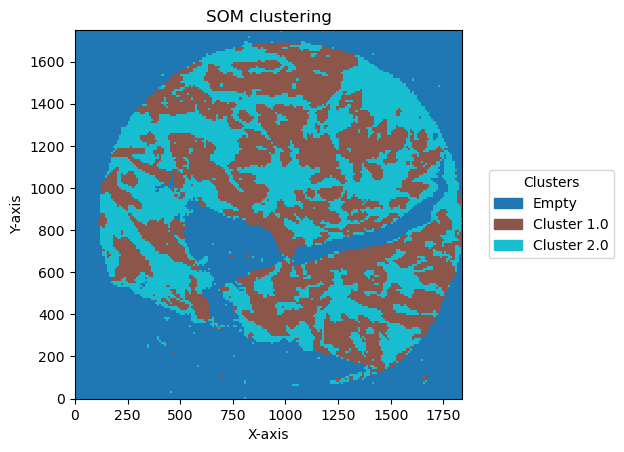

Plotting bin size: 10, SOM name: TMA1_Selection25


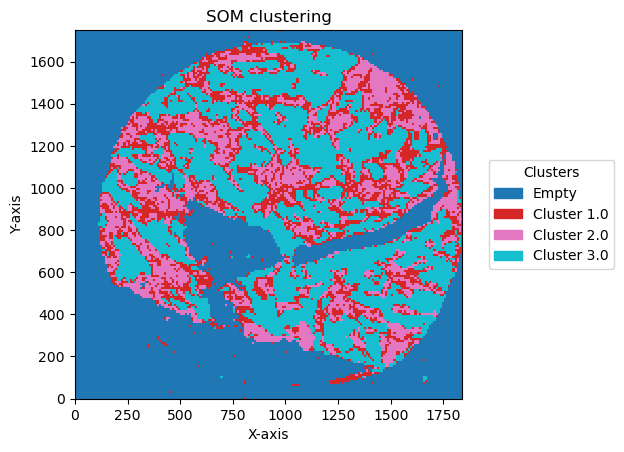

Plotting bin size: 10, SOM name: TMA1_Selection25


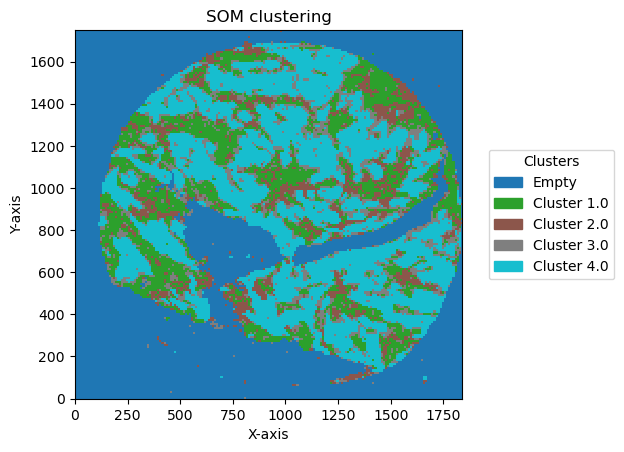

Plotting bin size: 10, SOM name: TMA1_Selection25


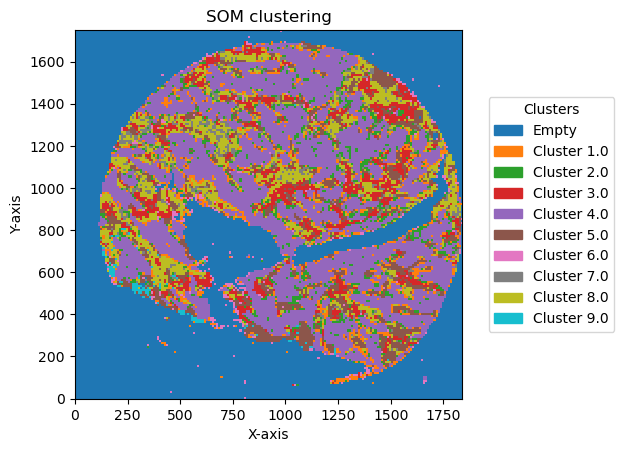

Plotting bin size: 10, SOM name: TMA1_Selection25


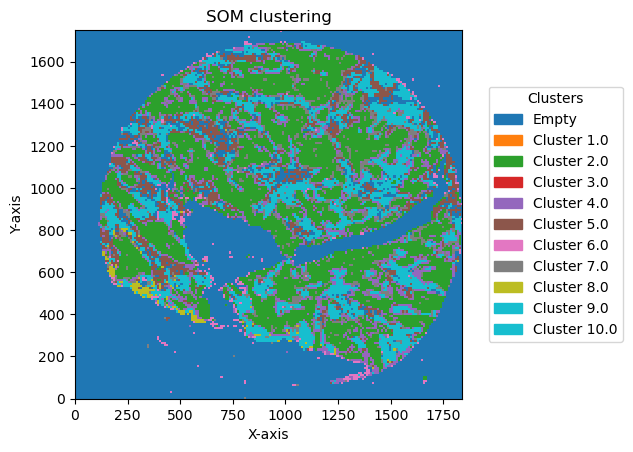

In [42]:
for som_image, bin_size in plot_data:
    for name, image in som_image.items():
        # Get unique clusters from your data (e.g., via np.unique(cluster_data))
        unique_clusters = np.unique(image)
        
        # Create the legend_labels dictionary only for detected clusters
        legend_labels = {i: f'Cluster {i}' for i in unique_clusters}
        
        # Optional: set specific labels if certain clusters have special meanings
        if 0 in unique_clusters:
            legend_labels[0] = 'Empty'
        print(f"Plotting bin size: {bin_size}, SOM name: {name}")
        GC.plot_som(image, cmap=plt.cm.tab10, path=None, show=True, figsize=(5, 5), ax=None, legend_labels=legend_labels)

# Use SOM. Bin all the images and aply a SOM cluster to a cohort at same time. 
https://www.nature.com/articles/s41467-023-40068-5#Sec12

obtain list of dfs 

In [59]:
df_list = []
df_name_list = []
for file_csv in tqdm(files, desc="Processing Folders", unit="folder"):
    start_time = time.time()
    
    df_total = pd.read_csv(file_csv)

    df_total = df_total[['x_location', 'y_location', 'feature_name']]
    df_total = df_total.rename(columns={'feature_name': 'target'})
    df_total = df_total[~df_total['target'].str.contains('System|egative')]
    df_total['X'] = df_total['x_location'] - min(df_total['x_location'])
    df_total['Y'] = df_total['y_location'] - min(df_total['y_location'])
    
    # Extract the file name with extension
    file_name_with_ext = os.path.basename(file_csv)
    file_name = os.path.splitext(file_name_with_ext)[0]     # Remove the .csv extension
    df_list.append(df_total)
    df_name_list.append(file_name)

Processing Folders:  88%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 21/24 [01:06<00:10,  3.37s/folder]/tmp/ipykernel_3003168/2623634986.py:6: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df_total = pd.read_csv(file_csv)
Processing Folders: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [01:13<00:00,  3.04s/folder]


Get bins of all images in the cohort

In [65]:
bin_size = 10  # 10
min_counts = 20 # 10
unique_targets = df_total['target'].unique()

GB = GetBins(bin_size, unique_targets, logger)
GB.get_bin_cohort(df_list, df_name_list, cohort_name = 'HLA')
GB.preprocess_bin(min_counts = min_counts)
adata = GB.adata

/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
2024-11-11 23:57:18,058 - contour_logger - INFO - Time to get bins for 24 dataframes: 25.06 seconds
INFO:contour_logger:Time to get bins for 24 dataframes: 25.06 seconds
2024-11-11 23:57:18,059 - contour_logger - INFO - Number of bins: 655250
INFO:contour_logger:Number of bins: 655250
2024-11-11 23:57:18,060 - contour_logger - INFO - Number of genes: 479
INFO:contour_logger:Number of genes: 479
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. T

Get contours with a SOM with (2,1) shape

In [66]:
GC = GetContour(adata, logger)
GC.run_som(som_shape = (2,1), n_iter = 5000, sigma=.5, learning_rate=.5, random_state = 42)
som_images = GC.get_som_2d_image(bin_size = bin_size)

2024-11-11 23:57:29,776 - contour_logger - INFO - Time to run som on 430335 bins: 4.81
INFO:contour_logger:Time to run som on 430335 bins: 4.81
2024-11-11 23:57:29,780 - contour_logger - INFO - Number of clusters: 2
INFO:contour_logger:Number of clusters: 2
2024-11-11 23:57:29,782 - contour_logger - INFO - number of bins in each cluster: cluster_som
1    300381
0    129954
Name: count, dtype: int64
INFO:contour_logger:number of bins in each cluster: cluster_som
1    300381
0    129954
Name: count, dtype: int64


In [67]:
GC.eval_som_statistical(top_n=10)

... storing 'name' as categorical
... storing 'cohort' as categorical
2024-11-11 23:57:49,248 - contour_logger - INFO - n top genes for group 0
INFO:contour_logger:n top genes for group 0
2024-11-11 23:57:49,250 - contour_logger - INFO - 
     names       scores  logfoldchanges  pvals  pvals_adj
0    EPCAM  1134.282959        4.809339    0.0        0.0
1    KRT18   985.198120        3.932904    0.0        0.0
2     KRT8   719.444458        3.565292    0.0        0.0
3   LGALS3   479.880463        3.096575    0.0        0.0
4  CEACAM1   446.056274        4.087987    0.0        0.0
5     LAD1   409.283051        3.730915    0.0        0.0
6      MYC   387.892242        3.448492    0.0        0.0
7    STMN1   367.524933        2.601861    0.0        0.0
8     CD47   356.123566        2.437626    0.0        0.0
9     LCN2   353.067780        3.799570    0.0        0.0
INFO:contour_logger:
     names       scores  logfoldchanges  pvals  pvals_adj
0    EPCAM  1134.282959        4.809339    0

plot

/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


TMA1_Selection23_filtered


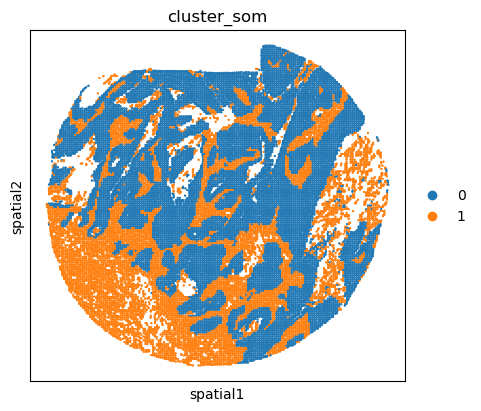

TMA1_Selection21_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


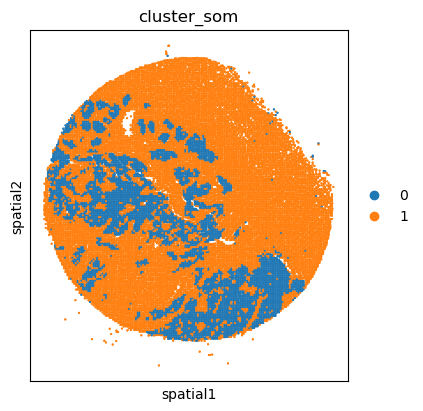

TMA1_Selection17_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


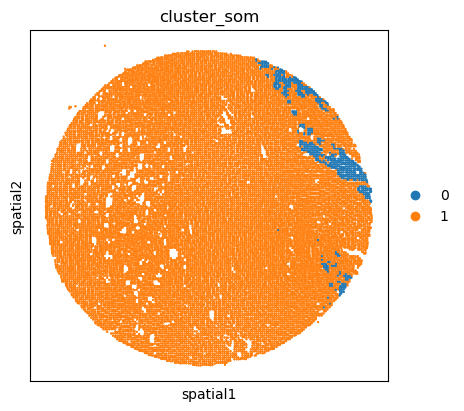

TMA1_Selection31_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


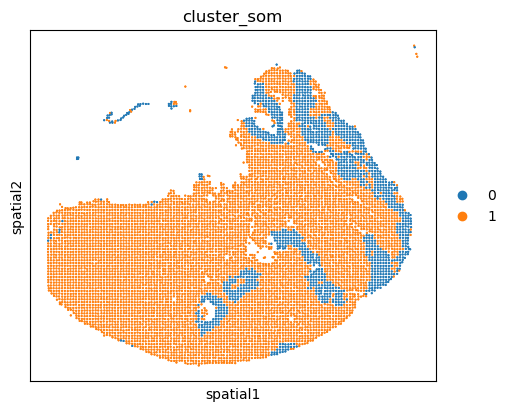

TMA1_Selection7_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


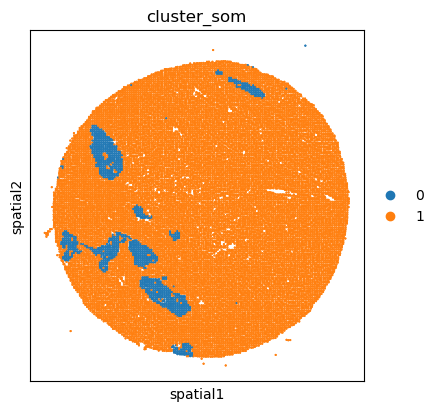

TMA1_Selection27_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


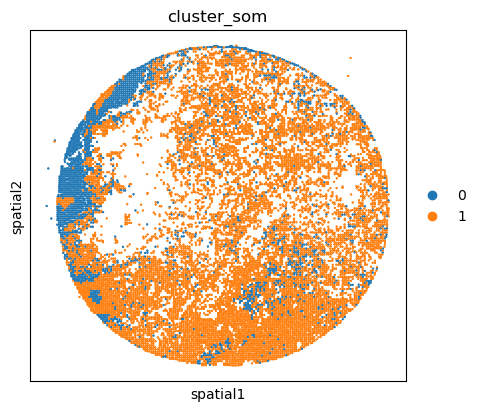

TMA1_Selection11_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


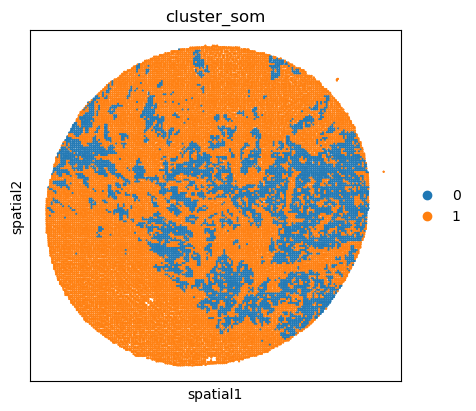

TMA1_Selection25_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


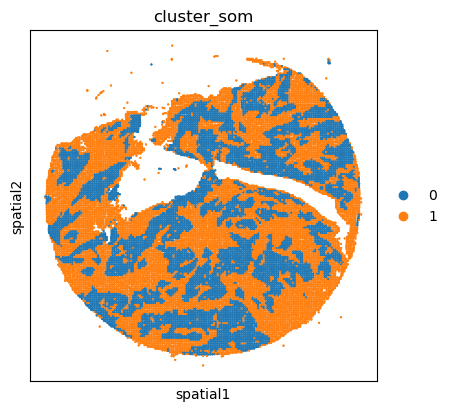

TMA1_Selection22_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


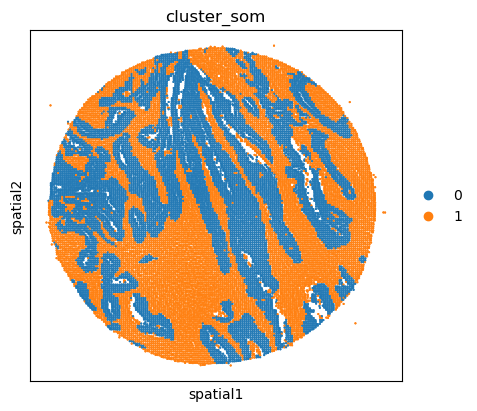

TMA1_Selection30_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


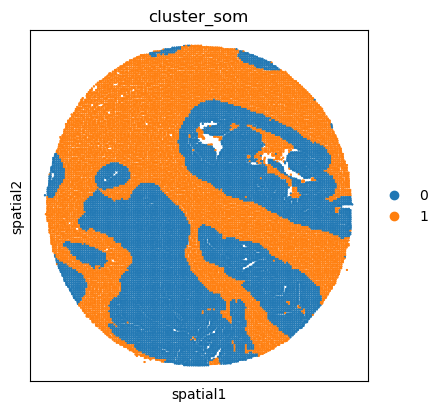

TMA1_Selection20_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


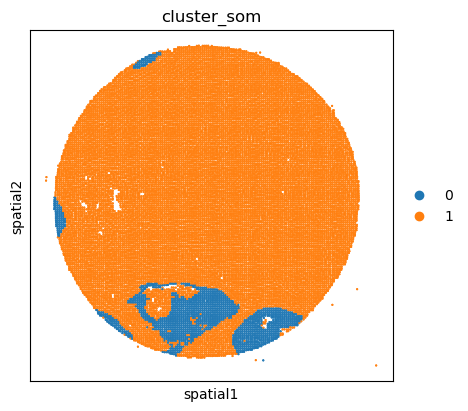

TMA1_Selection16_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


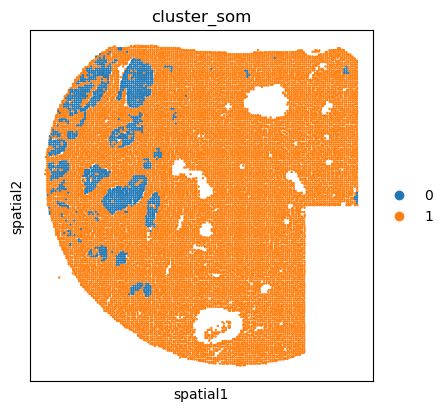

TMA1_Selection26_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


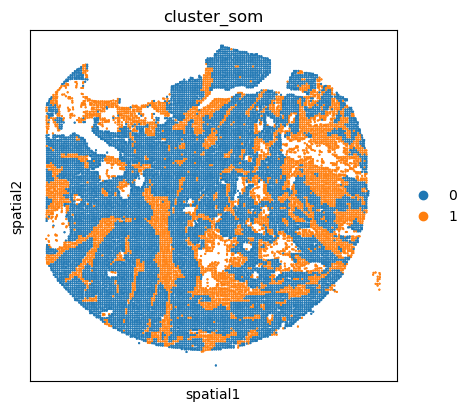

TMA1_Selection33_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


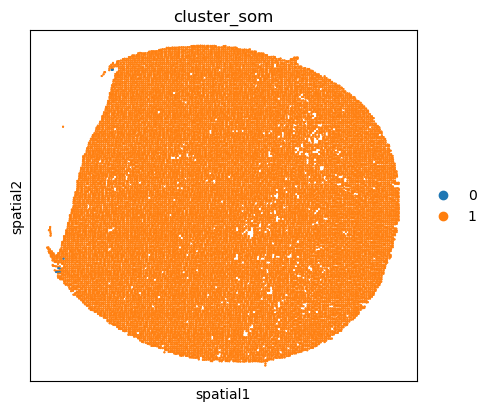

TMA1_Selection8_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


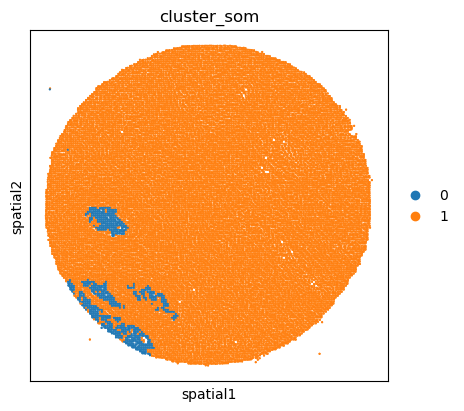

TMA1_Selection32_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


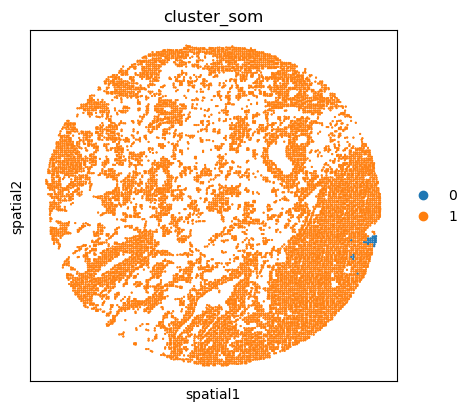

TMA1_Selection29_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


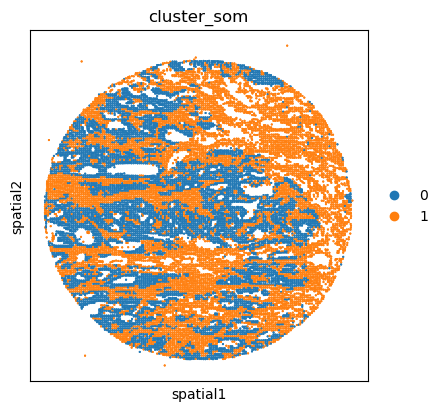

TMA1_Selection13_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


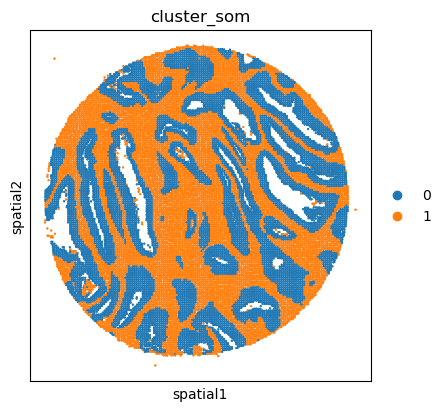

TMA1_Selection12_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


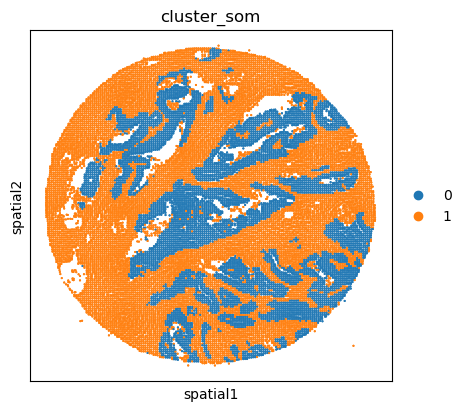

TMA1_Selection28_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


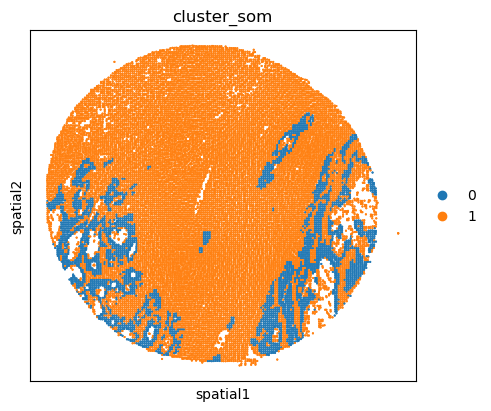

TMA1_Selection34_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


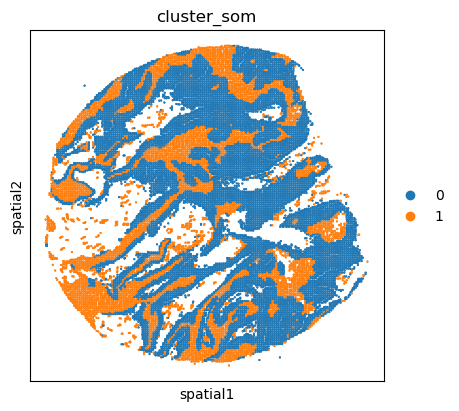

TMA1_Selection9_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


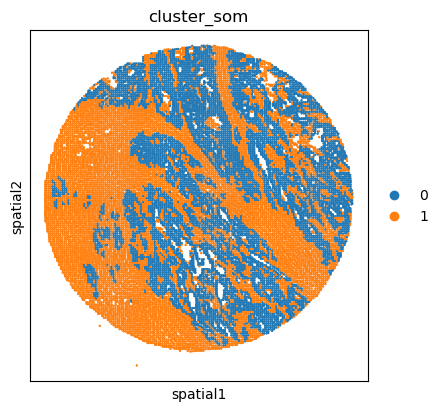

TMA1_Selection19_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


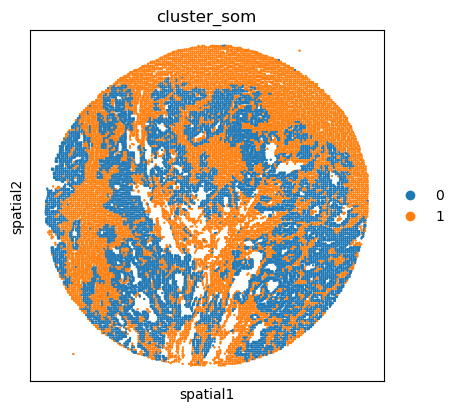

TMA1_Selection14_filtered


/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list
/home/martinha/miniconda3/envs/st/lib/python3.10/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


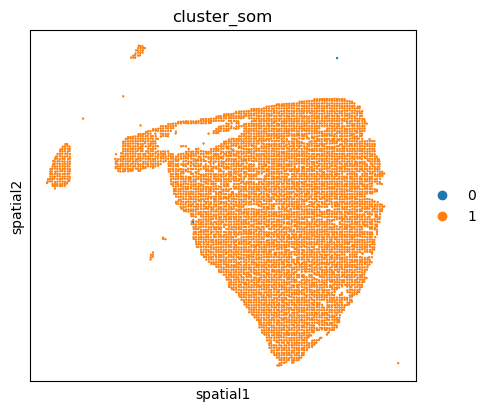

In [68]:
adata = GC.adata
unique_cases =adata.obs['name'].unique()
for case in unique_cases:
    # Filter the AnnData object for the current case
    adata_case = adata[adata.obs['name'] == case, :]
    print(case)
    plt.rcParams["figure.figsize"] = (5, 4)
    sq.pl.spatial_scatter(
            adata_case,
            library_id='name',
            shape=None,
            color=["cluster_som"],
            size=1,
    )
    plt.show()

# check how this relates ! to the other contours

USe ncvs instead of grids! 
Stability of the method 
How can I acess this 
what are the other clusters. 
one image vs cohort
Use SOM with specific genes?  

shoudldo morphological operations or gaussian blur 

If you feel that the masks shoud be refined. you can use morphological operations 